# import modules

In [ ]:
import glob
import sys

sys.path.insert(0, "../")

from modules.contours_v0 import *
from modules.default_params_v1 import *
from modules.plot_utils import *

print("Number of cores: ", cpu_count())

# as a function of $\Delta t_d$ while fixing $I$

In [11]:
file_pattern = "../data/mismatch_contours_mcz30_td_*.pkl"
files = glob.glob(file_pattern)

combined_dict = {}
combined_td_arr = np.array([])
combined_MLz_arr = np.array([])

for file in files:
    with open(file, "rb") as f:
        data = pickle.load(f)
        combined_dict.update(data)
        combined_td_arr = np.append(combined_td_arr, data["td_arr"])
        combined_MLz_arr = np.append(combined_MLz_arr, data["MLz_arr"])

sorted_indices = np.argsort(combined_MLz_arr)  # MLz_arr is the input parameter
combined_dict["MLz_arr"] = combined_MLz_arr[sorted_indices]
combined_dict["td_arr"] = combined_td_arr[sorted_indices]

combined_dict

{0.035568: {'contour': {'omega_matrix': array([[0.        , 0.21428571, 0.42857143, 0.64285714, 0.85714286,
           1.07142857, 1.28571429, 1.5       , 1.71428571, 1.92857143,
           2.14285714, 2.35714286, 2.57142857, 2.78571429, 3.        ],
          [0.        , 0.21428571, 0.42857143, 0.64285714, 0.85714286,
           1.07142857, 1.28571429, 1.5       , 1.71428571, 1.92857143,
           2.14285714, 2.35714286, 2.57142857, 2.78571429, 3.        ],
          [0.        , 0.21428571, 0.42857143, 0.64285714, 0.85714286,
           1.07142857, 1.28571429, 1.5       , 1.71428571, 1.92857143,
           2.14285714, 2.35714286, 2.57142857, 2.78571429, 3.        ],
          [0.        , 0.21428571, 0.42857143, 0.64285714, 0.85714286,
           1.07142857, 1.28571429, 1.5       , 1.71428571, 1.92857143,
           2.14285714, 2.35714286, 2.57142857, 2.78571429, 3.        ],
          [0.        , 0.21428571, 0.42857143, 0.64285714, 0.85714286,
           1.07142857, 1.28571429, 1

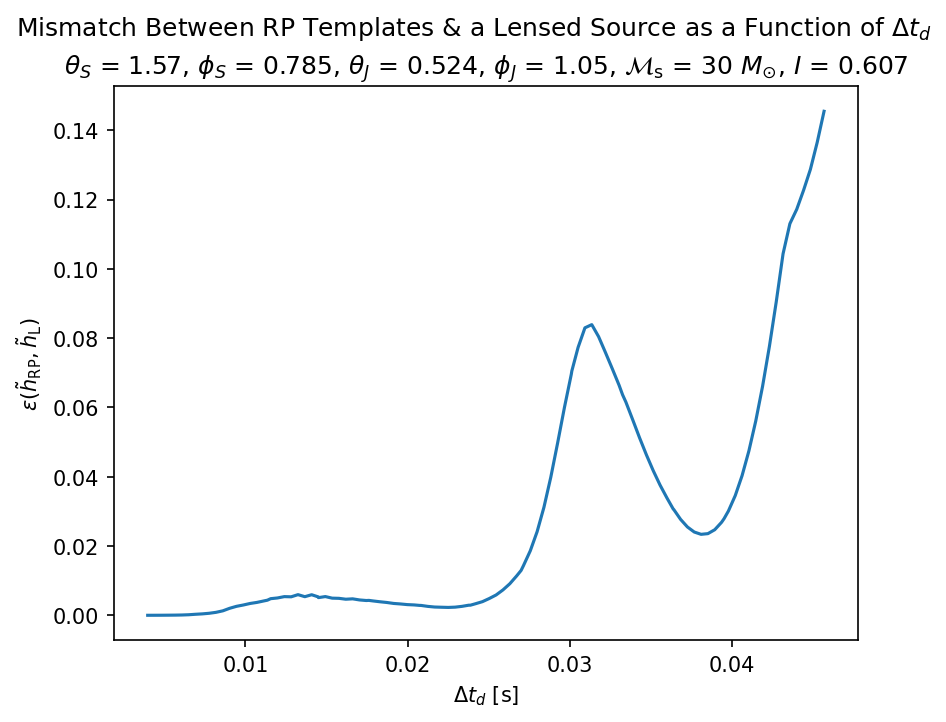

In [12]:
data_td = combined_dict

lens_params = data_td["source_params"]
td_arr = data_td["td_arr"]
td_ep_min_arr = np.array([data_td[td]["stats"]["ep_min"] for td in td_arr])

plt.plot(td_arr, td_ep_min_arr, label=r"$\epsilon(\~h_{\rm RP}, \~h_{\rm L})$")
plt.xlabel(r"$\Delta t_d$ [s]")
plt.ylabel(r"$\epsilon(\~h_{\rm RP}, \~h_{\rm L})$")

plt.title(
    r"$\theta_S$ = {:.3g}, $\phi_S$ = {:.3g}, $\theta_J$ = {:.3g}, $\phi_J$ = {:.3g}, {} = {:.3g} {}, $I$ = {:.3g}".format(
        lens_params["theta_S"],
        lens_params["phi_S"],
        lens_params["theta_J"],
        lens_params["phi_J"],
        r"$\mathcal{M}_{\text{s}}$",
        lens_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
        data_td["I"],
    )
)

plt.suptitle(
    r"Mismatch Between RP Templates & a Lensed Source as a Function of $\Delta t_d$"
)

plt.show()

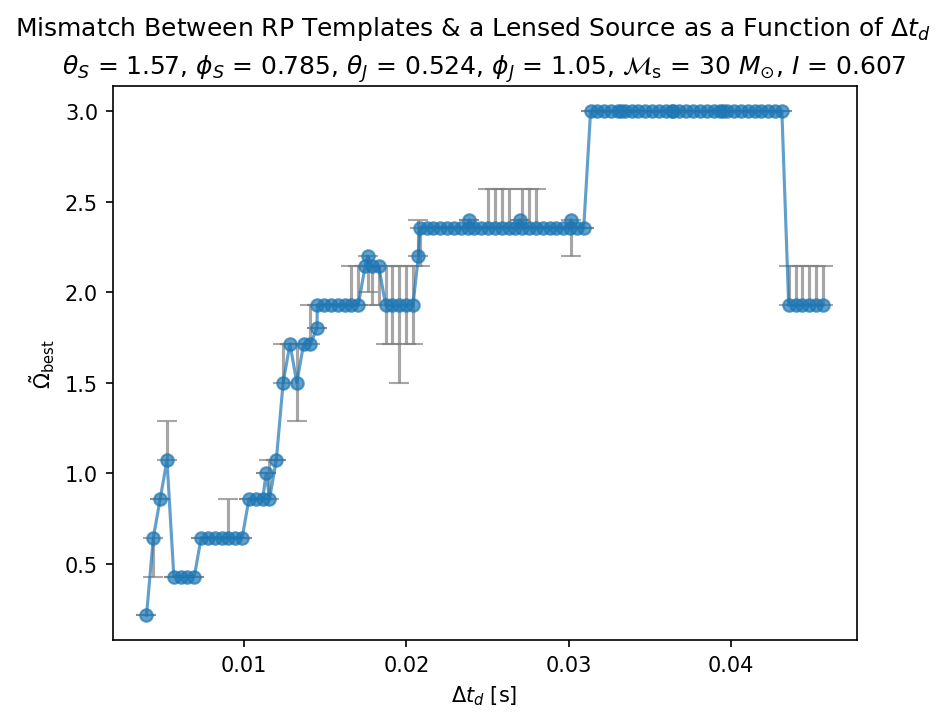

In [13]:
data_td = combined_dict

lens_params = data_td["source_params"]
td_arr = data_td["td_arr"]
td_ep_min_omega_tilde_arr = np.array(
    [data_td[td]["stats"]["ep_min_omega_tilde"] for td in td_arr]
)

plt.errorbar(
    td_arr,
    td_ep_min_omega_tilde_arr,
    yerr=get_asym_err(data_td, td_arr, "omega_tilde"),
    fmt="-o",
    label=r"$\~{\Omega}_{\rm best}$",
    capsize=5,
    ecolor="grey",
    alpha=0.7,
)
plt.xlabel(r"$\Delta t_d$ [s]")
plt.ylabel(r"$\~{\Omega}_{\rm best}$")

plt.title(
    r"$\theta_S$ = {:.3g}, $\phi_S$ = {:.3g}, $\theta_J$ = {:.3g}, $\phi_J$ = {:.3g}, {} = {:.3g} {}, $I$ = {:.3g}".format(
        lens_params["theta_S"],
        lens_params["phi_S"],
        lens_params["theta_J"],
        lens_params["phi_J"],
        r"$\mathcal{M}_{\text{s}}$",
        lens_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
        data_td["I"],
    )
)

plt.suptitle(
    r"Mismatch Between RP Templates & a Lensed Source as a Function of $\Delta t_d$"
)

plt.show()

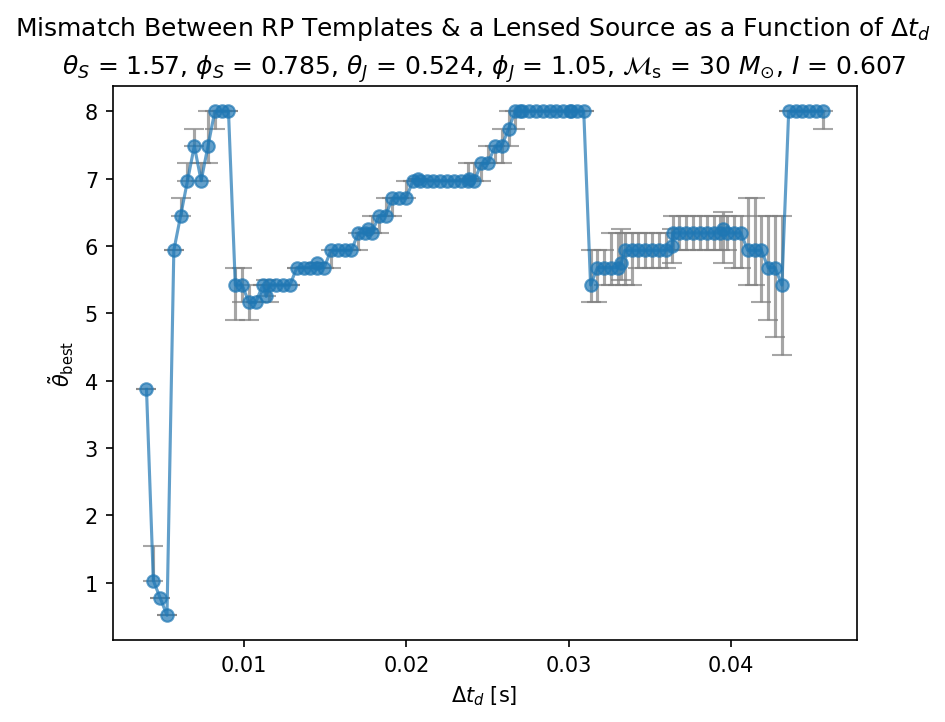

In [14]:
data_td = combined_dict

lens_params = data_td["source_params"]
td_arr = data_td["td_arr"]
td_ep_min_theta_tilde_arr = np.array(
    [data_td[td]["stats"]["ep_min_theta_tilde"] for td in td_arr]
)

plt.errorbar(
    td_arr,
    td_ep_min_theta_tilde_arr,
    yerr=get_asym_err(data_td, td_arr, "theta_tilde"),
    fmt="-o",
    label=r"$\~{\theta}_{\rm best}$",
    capsize=5,
    ecolor="grey",
    alpha=0.7,
)
plt.xlabel(r"$\Delta t_d$ [s]")
plt.ylabel(r"$\~{\theta}_{\rm best}$")

plt.title(
    r"$\theta_S$ = {:.3g}, $\phi_S$ = {:.3g}, $\theta_J$ = {:.3g}, $\phi_J$ = {:.3g}, {} = {:.3g} {}, $I$ = {:.3g}".format(
        lens_params["theta_S"],
        lens_params["phi_S"],
        lens_params["theta_J"],
        lens_params["phi_J"],
        r"$\mathcal{M}_{\text{s}}$",
        lens_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
        data_td["I"],
    )
)

plt.suptitle(
    r"Mismatch Between RP Templates & a Lensed Source as a Function of $\Delta t_d$"
)

plt.show()

# as a function of $I$ while fixing $\Delta t_d$

In [15]:
file_pattern = "../data/mismatch_contours_mcz30_I_*.pkl"
files = glob.glob(file_pattern)

combined_dict = {}
combined_I_arr = np.array([])
combined_y_arr = np.array([])
combined_MLz_arr = np.array([])

for file in files:
    with open(file, "rb") as f:
        data = pickle.load(f)
        combined_dict.update(data)
        combined_I_arr = np.append(combined_I_arr, data["I_arr"])
        combined_y_arr = np.append(combined_y_arr, data["y_arr"])
        combined_MLz_arr = np.append(combined_MLz_arr, data["MLz_arr"])

sorted_indices = np.argsort(combined_y_arr)  # y_arr is the input parameter
combined_dict["y_arr"] = combined_y_arr[sorted_indices]
combined_dict["MLz_arr"] = combined_MLz_arr[sorted_indices]
combined_dict["I_arr"] = combined_I_arr[sorted_indices]

combined_dict

{0.120931: {'contour': {'omega_matrix': array([[0.        , 0.21428571, 0.42857143, 0.64285714, 0.85714286,
           1.07142857, 1.28571429, 1.5       , 1.71428571, 1.92857143,
           2.14285714, 2.35714286, 2.57142857, 2.78571429, 3.        ],
          [0.        , 0.21428571, 0.42857143, 0.64285714, 0.85714286,
           1.07142857, 1.28571429, 1.5       , 1.71428571, 1.92857143,
           2.14285714, 2.35714286, 2.57142857, 2.78571429, 3.        ],
          [0.        , 0.21428571, 0.42857143, 0.64285714, 0.85714286,
           1.07142857, 1.28571429, 1.5       , 1.71428571, 1.92857143,
           2.14285714, 2.35714286, 2.57142857, 2.78571429, 3.        ],
          [0.        , 0.21428571, 0.42857143, 0.64285714, 0.85714286,
           1.07142857, 1.28571429, 1.5       , 1.71428571, 1.92857143,
           2.14285714, 2.35714286, 2.57142857, 2.78571429, 3.        ],
          [0.        , 0.21428571, 0.42857143, 0.64285714, 0.85714286,
           1.07142857, 1.28571429, 1

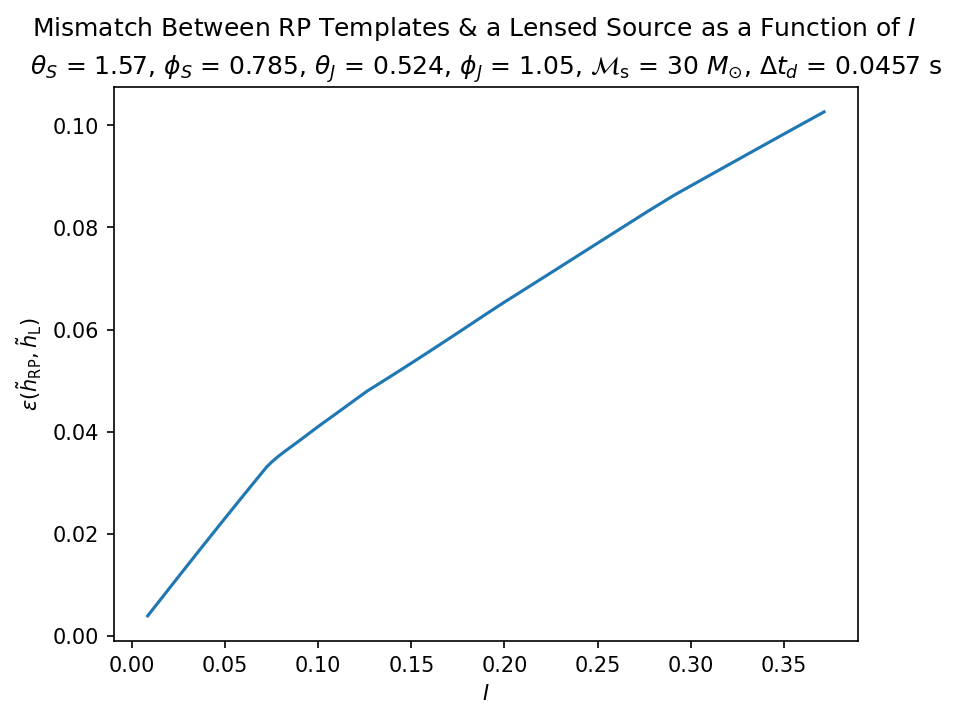

In [16]:
data_I = combined_dict

lens_params = data_I["source_params"]
I_arr = data_I["I_arr"]
I_ep_min_arr = np.array([data_I[I]["stats"]["ep_min"] for I in I_arr])

plt.plot(I_arr, I_ep_min_arr, label=r"$\epsilon(\~h_{\rm RP}, \~h_{\rm L})$")
plt.xlabel(r"$I$")
plt.ylabel(r"$\epsilon(\~h_{\rm RP}, \~h_{\rm L})$")

plt.title(
    r"$\theta_S$ = {:.3g}, $\phi_S$ = {:.3g}, $\theta_J$ = {:.3g}, $\phi_J$ = {:.3g}, {} = {:.3g} {}, $\Delta t_d$ = {:.3g} s".format(
        lens_params["theta_S"],
        lens_params["phi_S"],
        lens_params["theta_J"],
        lens_params["phi_J"],
        r"$\mathcal{M}_{\text{s}}$",
        lens_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
        data_I["td"],
    )
)

plt.suptitle(r"Mismatch Between RP Templates & a Lensed Source as a Function of $I$")

plt.show()

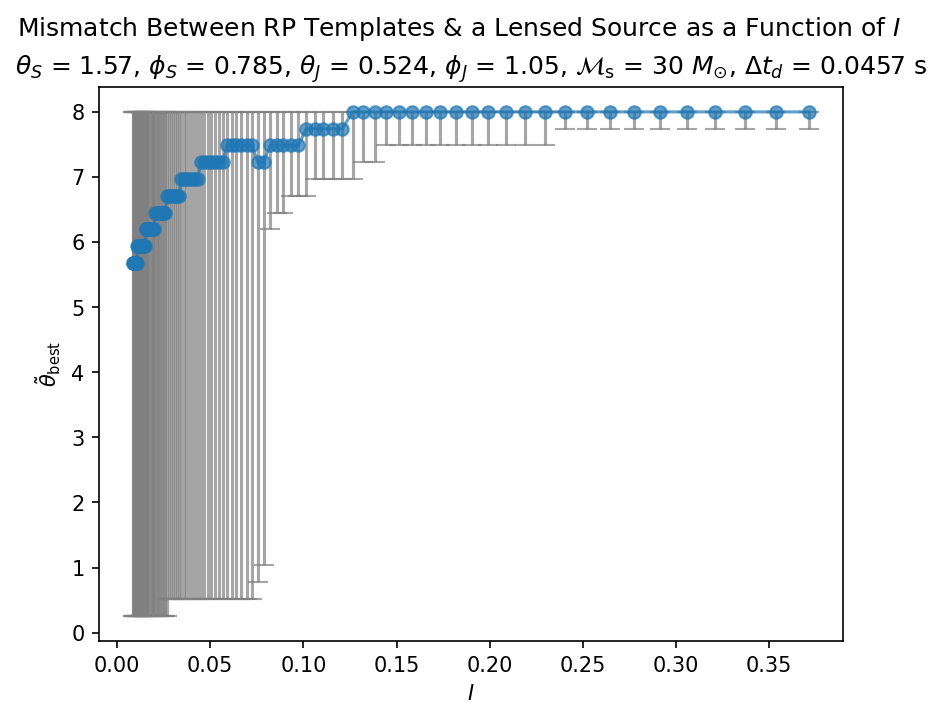

In [17]:
data_I = combined_dict

lens_params = data_I["source_params"]
I_arr = data_I["I_arr"]
I_ep_min_theta_tilde_arr = np.array(
    [data_I[I]["stats"]["ep_min_theta_tilde"] for I in I_arr]
)

plt.errorbar(
    I_arr,
    I_ep_min_theta_tilde_arr,
    yerr=get_asym_err(data_I, I_arr, "theta_tilde"),
    fmt="-o",
    label=r"$\~{\theta}_{\rm best}$",
    capsize=5,
    ecolor="grey",
    alpha=0.7,
)

plt.xlabel(r"$I$")
plt.ylabel(r"$\~{\theta}_{\rm best}$")

plt.title(
    r"$\theta_S$ = {:.3g}, $\phi_S$ = {:.3g}, $\theta_J$ = {:.3g}, $\phi_J$ = {:.3g}, {} = {:.3g} {}, $\Delta t_d$ = {:.3g} s".format(
        lens_params["theta_S"],
        lens_params["phi_S"],
        lens_params["theta_J"],
        lens_params["phi_J"],
        r"$\mathcal{M}_{\text{s}}$",
        lens_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
        data_I["td"],
    )
)

plt.suptitle(r"Mismatch Between RP Templates & a Lensed Source as a Function of $I$")

plt.show()

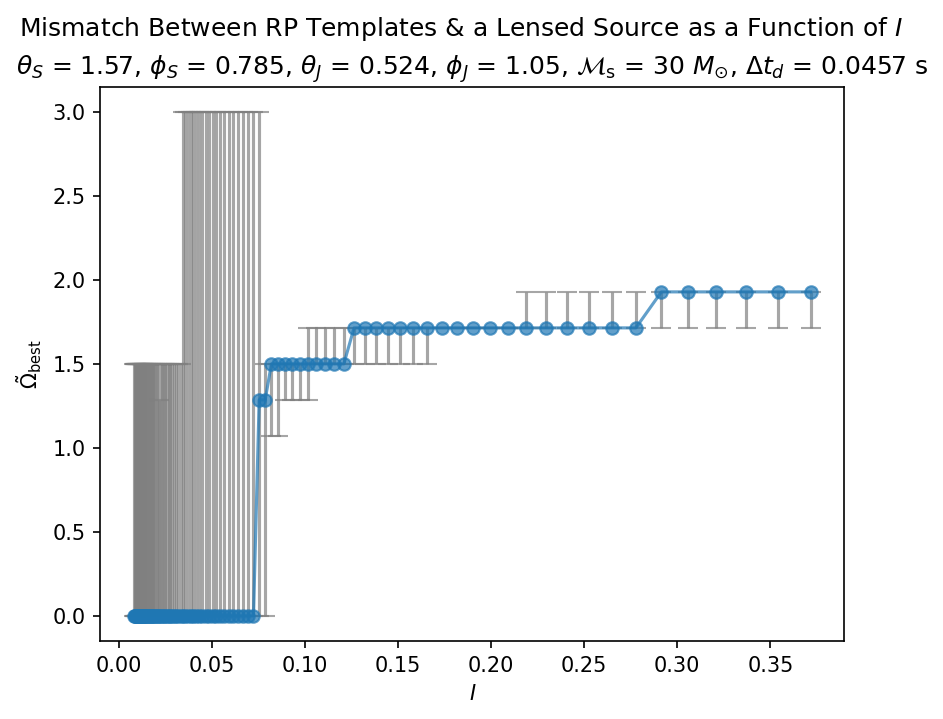

In [18]:
data_I = combined_dict

lens_params = data_I["source_params"]
I_arr = data_I["I_arr"]
I_ep_min_omega_tilde_arr = np.array(
    [data_I[I]["stats"]["ep_min_omega_tilde"] for I in I_arr]
)

plt.errorbar(
    I_arr,
    I_ep_min_omega_tilde_arr,
    yerr=get_asym_err(data_I, I_arr, "omega_tilde"),
    fmt="-o",
    label=r"$\~{\Omega}_{\rm best}$",
    capsize=5,
    ecolor="grey",
    alpha=0.7,
)

plt.xlabel(r"$I$")
plt.ylabel(r"$\~{\Omega}_{\rm best}$")

plt.title(
    r"$\theta_S$ = {:.3g}, $\phi_S$ = {:.3g}, $\theta_J$ = {:.3g}, $\phi_J$ = {:.3g}, {} = {:.3g} {}, $\Delta t_d$ = {:.3g} s".format(
        lens_params["theta_S"],
        lens_params["phi_S"],
        lens_params["theta_J"],
        lens_params["phi_J"],
        r"$\mathcal{M}_{\text{s}}$",
        lens_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
        data_I["td"],
    )
)

plt.suptitle(r"Mismatch Between RP Templates & a Lensed Source as a Function of $I$")

plt.show()

# waveform comparison

idx = 1.03917e-08, phi = -2.00551e-08, both should be ~0 if get_updated_mismatch_results is True


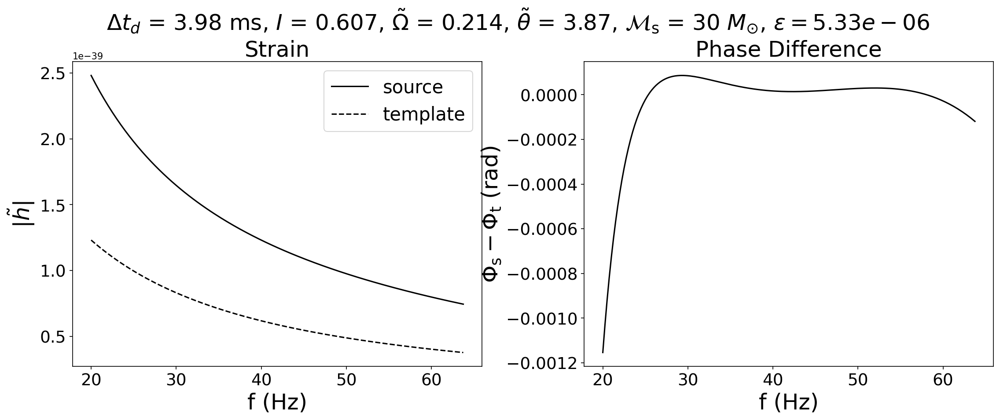

idx = -1.47772e-09, phi = 1.08804e-08, both should be ~0 if get_updated_mismatch_results is True


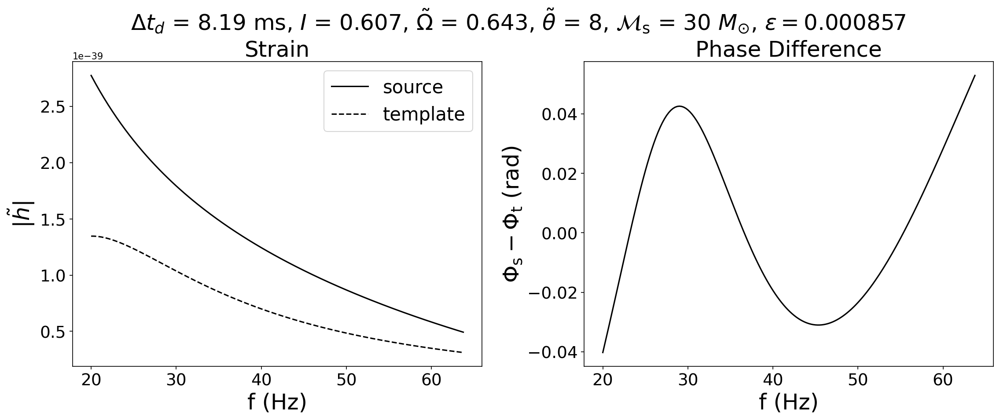

idx = -1.32395e-08, phi = 1.7918e-10, both should be ~0 if get_updated_mismatch_results is True


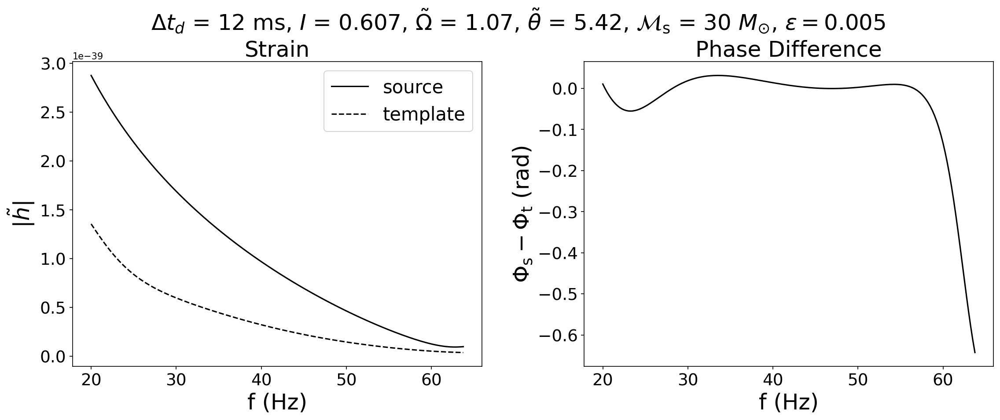

idx = -2.65694, phi = -5.88816e-12, both should be ~0 if get_updated_mismatch_results is True


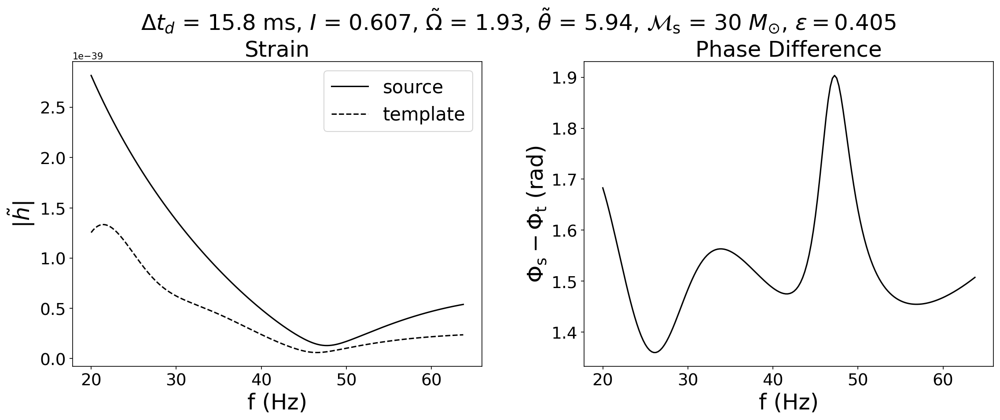

idx = -3.47612e-09, phi = 1.99385e-08, both should be ~0 if get_updated_mismatch_results is True


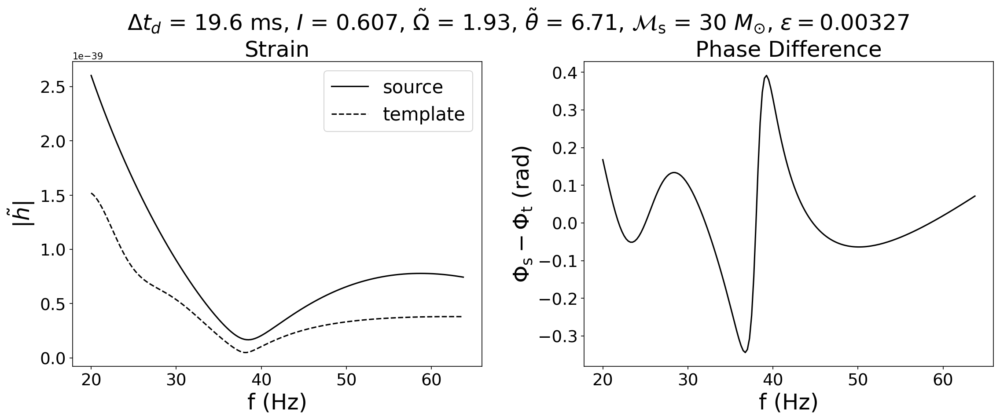

idx = -8.04523e-09, phi = -5.90784e-08, both should be ~0 if get_updated_mismatch_results is True


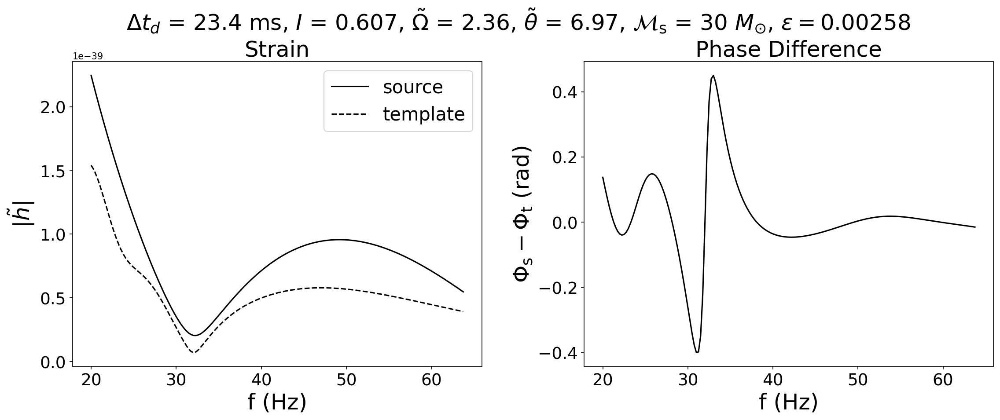

idx = 1.12709e-08, phi = 4.2606e-09, both should be ~0 if get_updated_mismatch_results is True


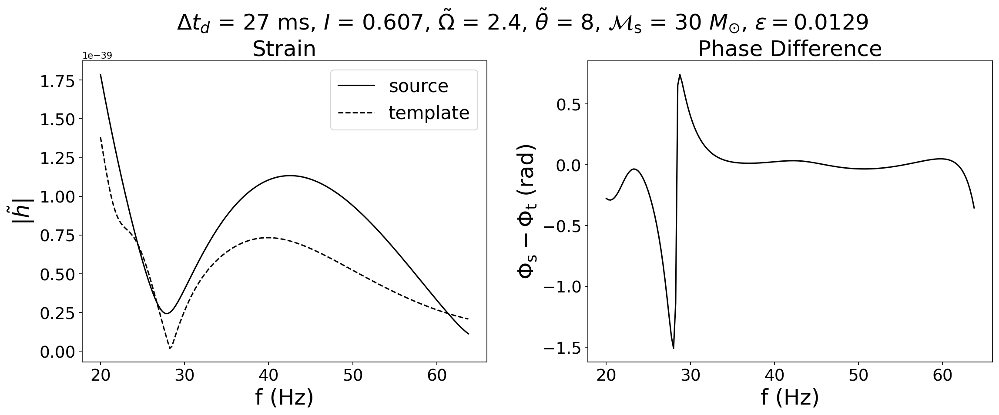

idx = 5.71538e-09, phi = 1.29717e-08, both should be ~0 if get_updated_mismatch_results is True


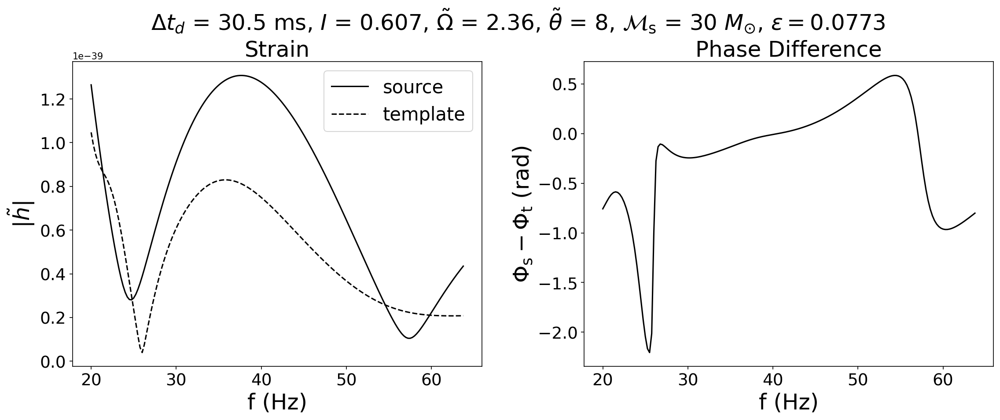

idx = -2.41725e-08, phi = 7.16666e-09, both should be ~0 if get_updated_mismatch_results is True


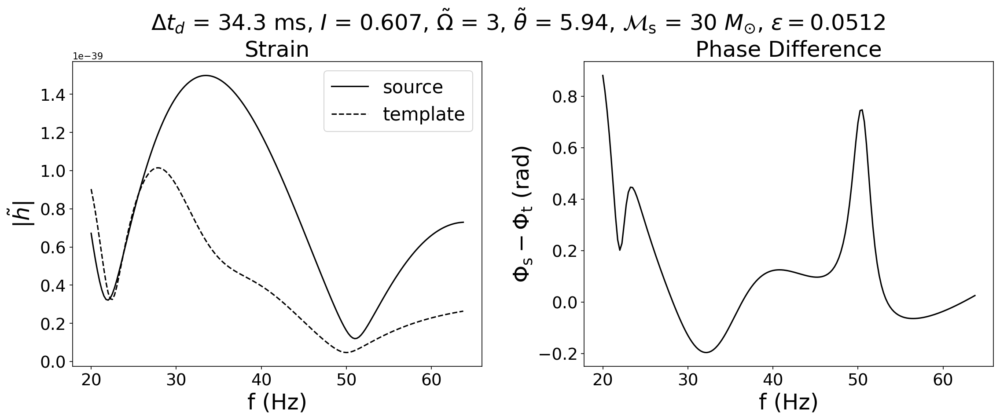

idx = -8.89651e-09, phi = 2.48066e-08, both should be ~0 if get_updated_mismatch_results is True


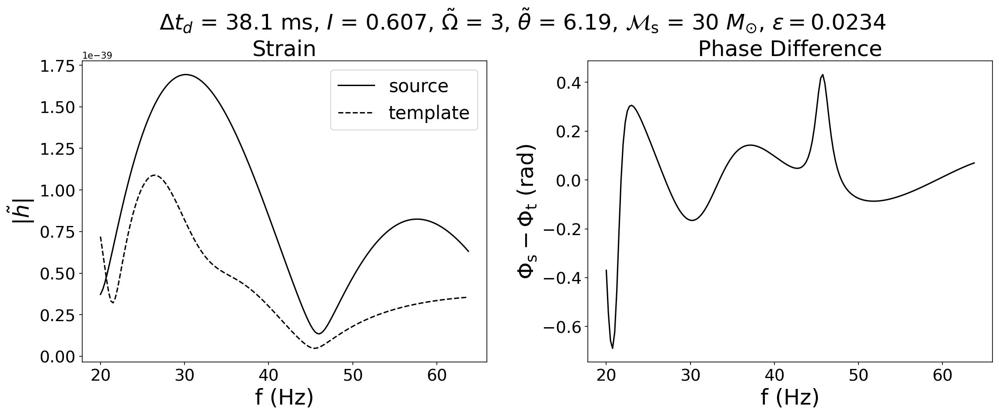

idx = 1.53558e-08, phi = -4.90984e-08, both should be ~0 if get_updated_mismatch_results is True


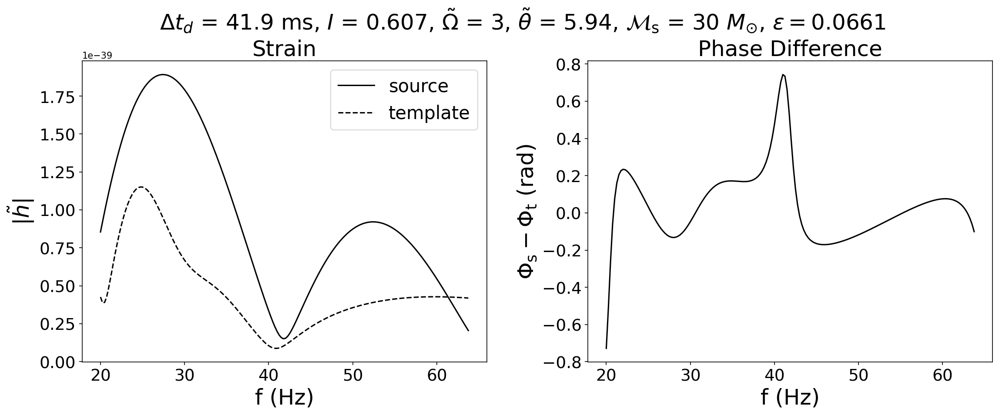

In [21]:
lens_params, RP_params = set_to_params(lens_params_1, RP_params_1)

lens_params["mcz"] = RP_params["mcz"] = 30 * solar_mass

MLz_arr = data_td["MLz_arr"]
td_arr = data_td["td_arr"]

for i in range(0, len(MLz_arr), 10):
    lens_params, RP_params = set_to_params(lens_params_1, RP_params_1)
    lens_params["mcz"] = RP_params["mcz"] = 30 * solar_mass
    lens_params["MLz"] = MLz_arr[i] * solar_mass
    RP_params["omega_tilde"] = data_td[td_arr[i]]["stats"]["ep_min_omega_tilde"]
    RP_params["theta_tilde"] = data_td[td_arr[i]]["stats"]["ep_min_theta_tilde"]
    RP_params["gamma_P"] = data_td[td_arr[i]]["stats"]["ep_min_gammaP"]

    plot_waveform_comparison(RP_params, lens_params, get_updated_mismatch_results=True)
    plt.show()

idx = -1.44845e-08, phi = 9.94532e-09, both should be ~0 if get_updated_mismatch_results is True


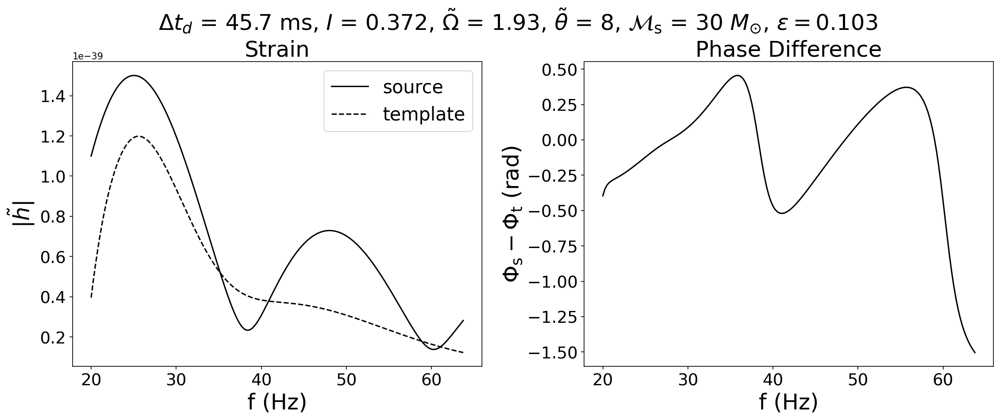

idx = -1.00769e-09, phi = 5.64807e-09, both should be ~0 if get_updated_mismatch_results is True


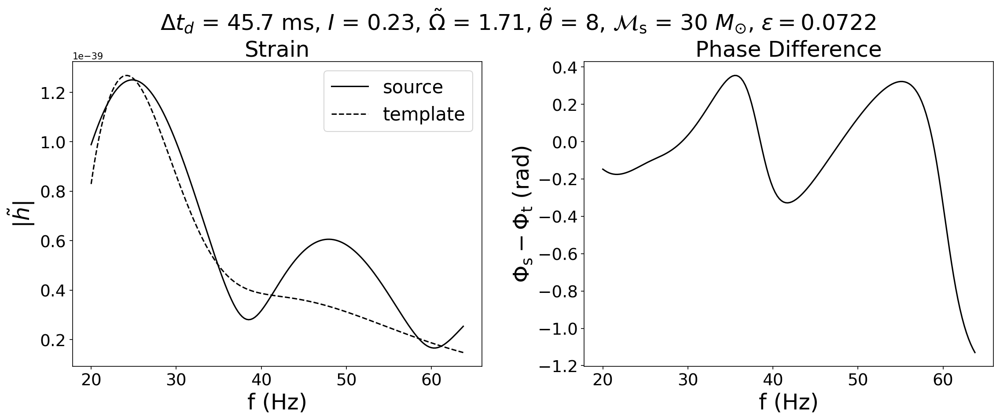

idx = -2.49172e-09, phi = -1.06695e-08, both should be ~0 if get_updated_mismatch_results is True


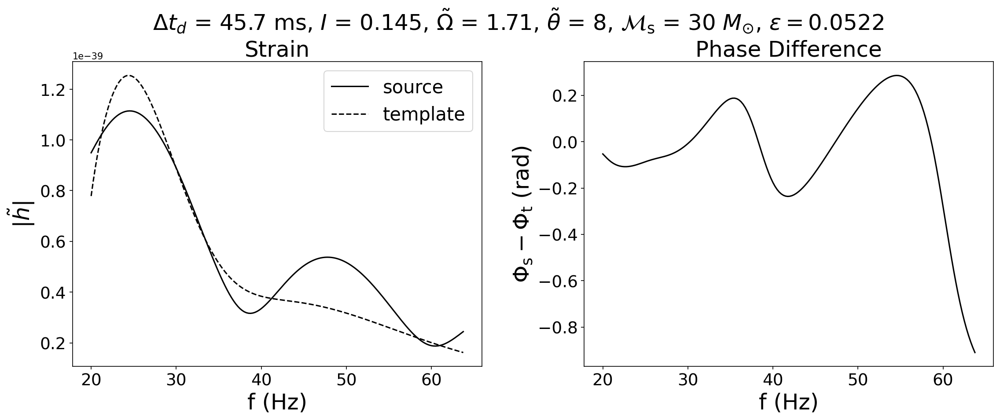

idx = -2.09811e-10, phi = -1.0255e-08, both should be ~0 if get_updated_mismatch_results is True


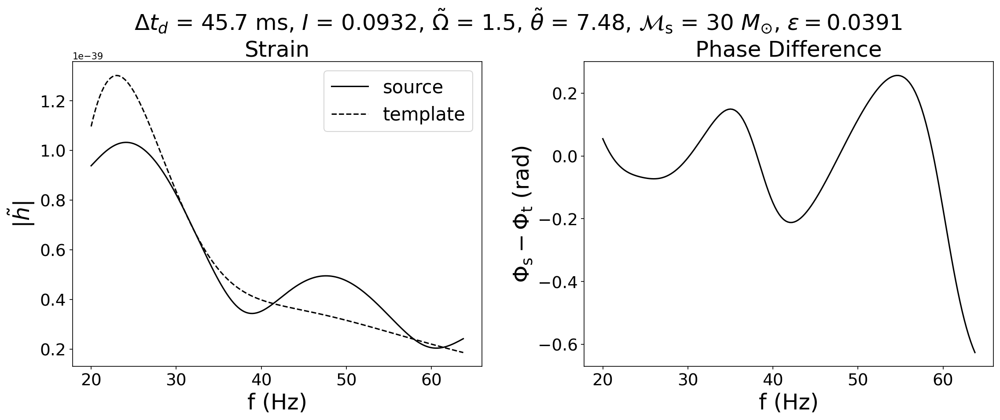

idx = -3.81749e-09, phi = 5.14618e-16, both should be ~0 if get_updated_mismatch_results is True


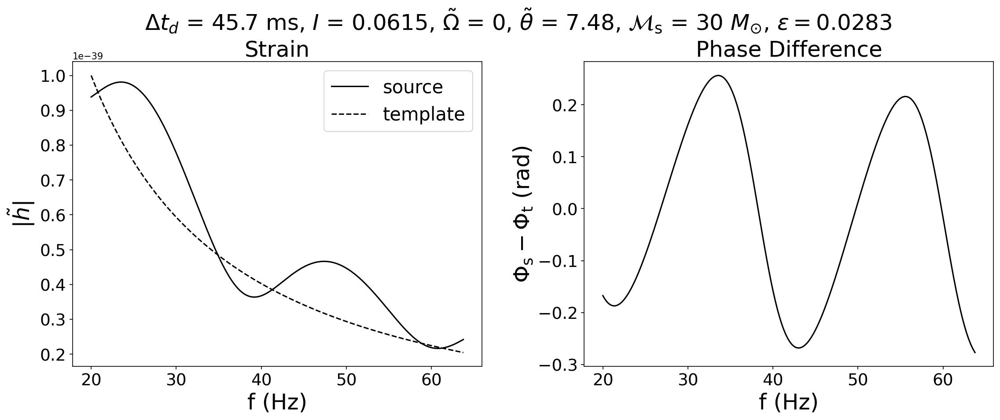

idx = 2.13306e-08, phi = -5.34779e-09, both should be ~0 if get_updated_mismatch_results is True


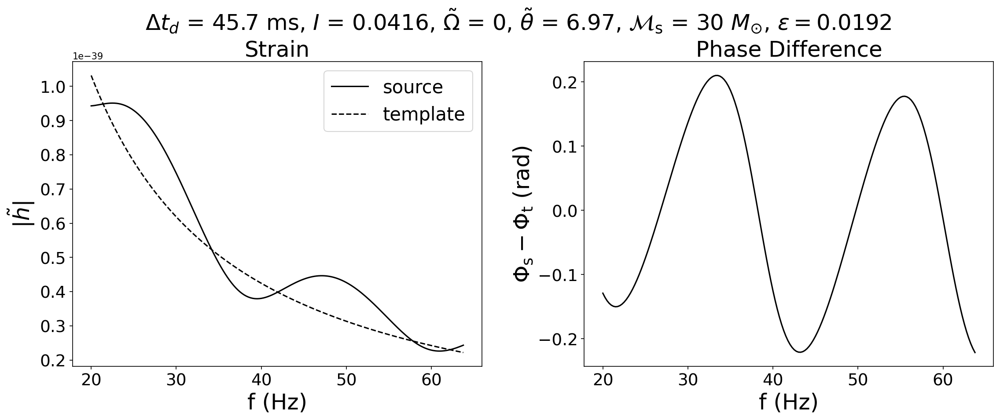

idx = -2.63262e-09, phi = -1.53898e-08, both should be ~0 if get_updated_mismatch_results is True


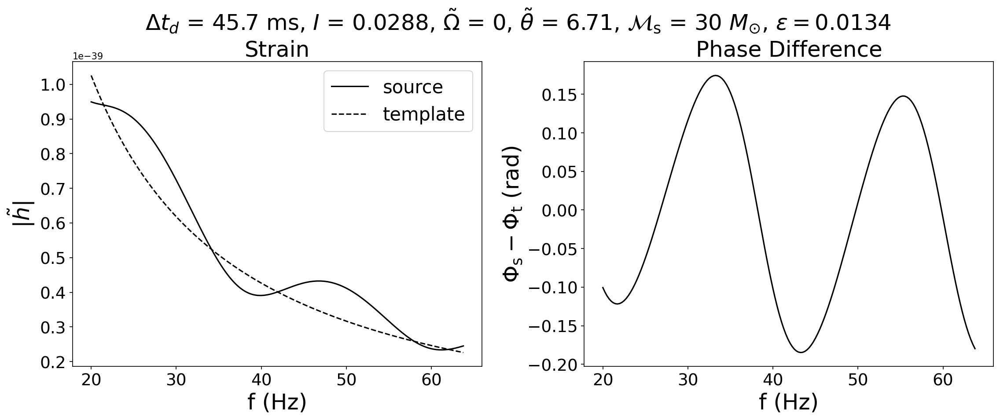

idx = -1.22608e-08, phi = 2.05648e-08, both should be ~0 if get_updated_mismatch_results is True


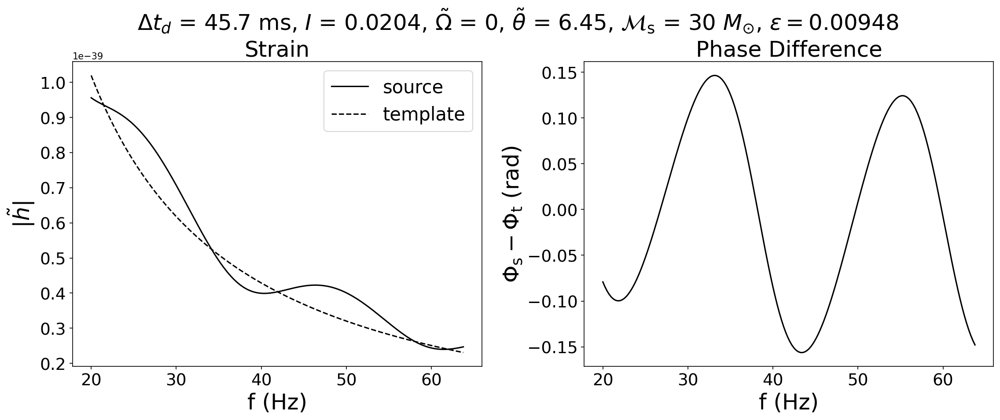

idx = -1.43468e-08, phi = 5.79322e-09, both should be ~0 if get_updated_mismatch_results is True


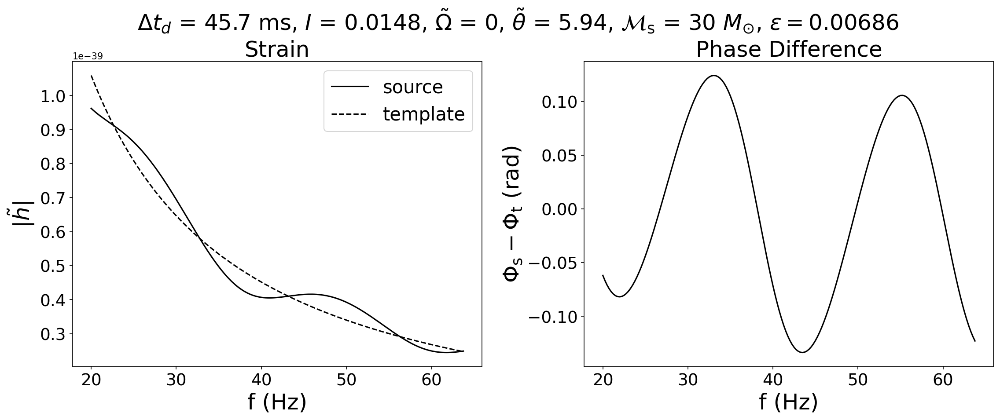

idx = -1.4152e-08, phi = -1.03098e-08, both should be ~0 if get_updated_mismatch_results is True


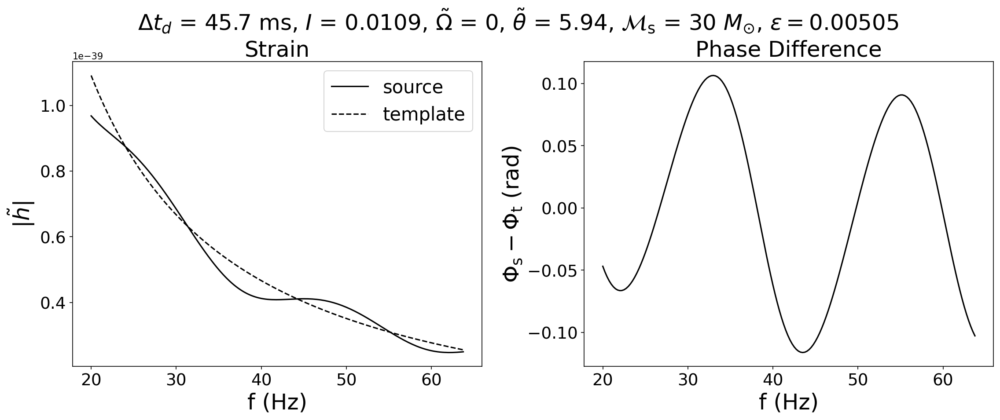

In [22]:
lens_params, RP_params = set_to_params(lens_params_1, RP_params_1)
lens_params["mcz"] = RP_params["mcz"] = 30 * solar_mass

y_arr = data_I["y_arr"]
MLz_arr = data_I["MLz_arr"]
I_arr = data_I["I_arr"]

for i in range(0, len(y_arr), 10):
    lens_params, RP_params = set_to_params(lens_params_1, RP_params_1)
    lens_params["mcz"] = RP_params["mcz"] = 30 * solar_mass
    lens_params["y"] = y_arr[i]
    lens_params["MLz"] = MLz_arr[i] * solar_mass
    RP_params["omega_tilde"] = data_I[I_arr[i]]["stats"]["ep_min_omega_tilde"]
    RP_params["theta_tilde"] = data_I[I_arr[i]]["stats"]["ep_min_theta_tilde"]
    RP_params["gamma_P"] = data_I[I_arr[i]]["stats"]["ep_min_gammaP"]

    plot_waveform_comparison(RP_params, lens_params, get_updated_mismatch_results=True)
    plt.show()